# Image analysis for multiple streamline plots-Parth Pai-22B3305

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from skimage import io, color, filters, transform
from skimage.feature import canny
from skimage.transform import probabilistic_hough_line
import cv2
from collections import defaultdict
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
csv_path = '/content/drive/MyDrive/228_final_project/final_translated_data_1_6.csv'

In [ ]:
df = pd.read_csv(csv_path)

In [ ]:
df_new = df[['t','x','y','u','v']]

In [ ]:
from scipy.interpolate import griddata
from io import BytesIO
from PIL import Image

def generate_streamlines(X, Y, u, v, i, density=2):
    plt.streamplot(X, Y, u, v, density=density)
    plt.axis('off')
    buffer = BytesIO()
    plt.savefig(buffer, format='png')
    buffer.seek(0)
    img = Image.open(buffer)
    img = img.convert('RGB')
    img.save(f'plot_{i}.jpg', 'JPEG')
    buffer.close()
    plt.show()

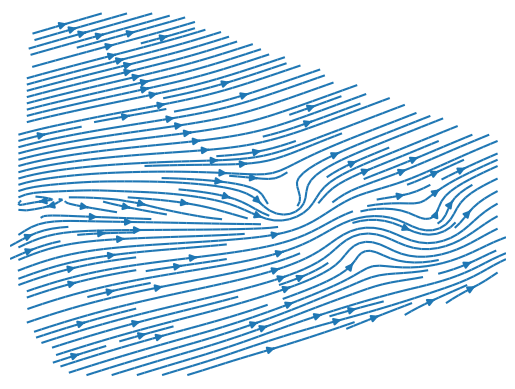

Plot for t =  1.6


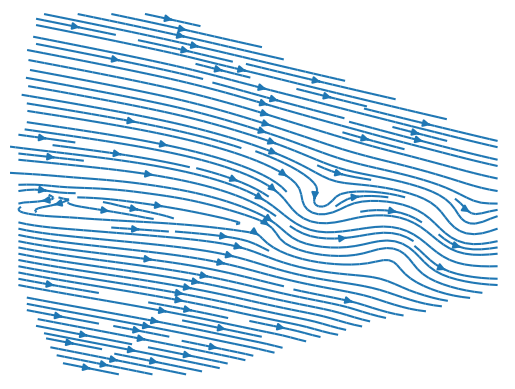

Plot for t =  1.7


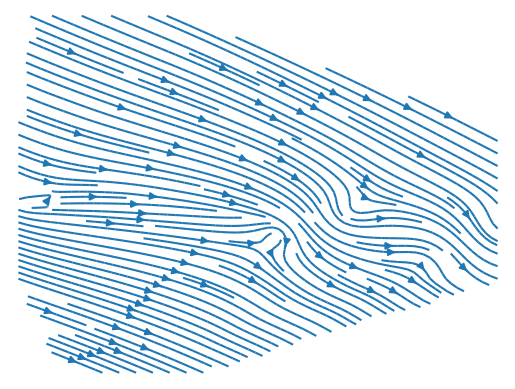

Plot for t =  1.8


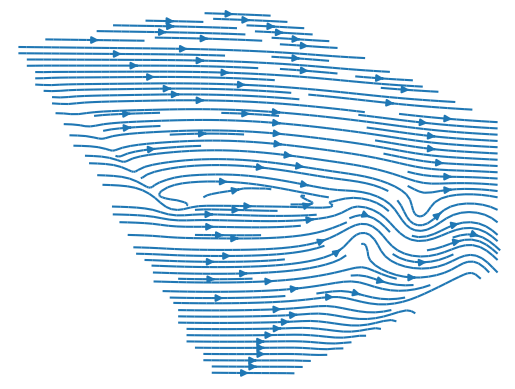

Plot for t =  1.9


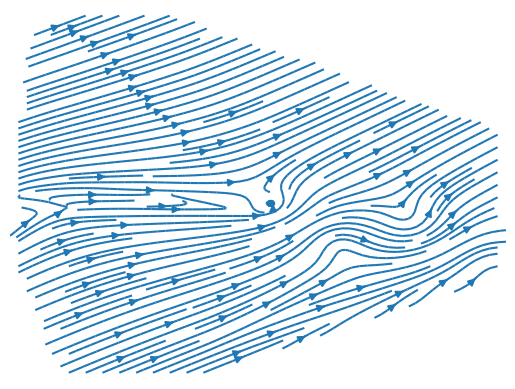

Plot for t =  2.0


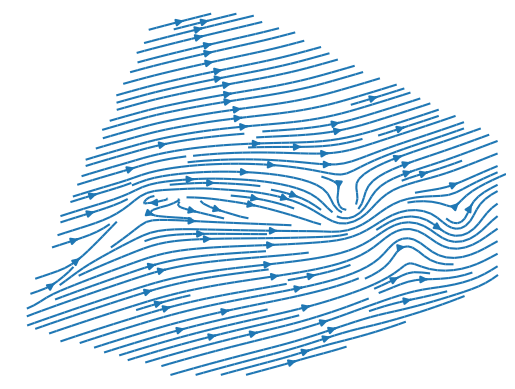

Plot for t =  2.1


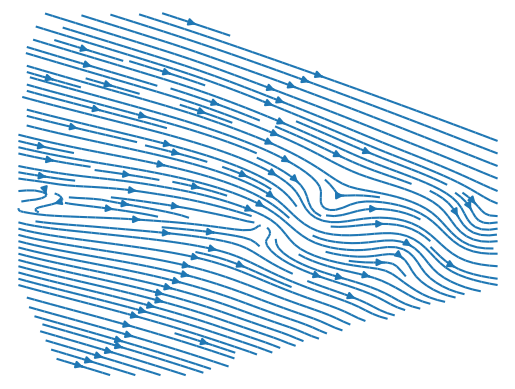

Plot for t =  2.2


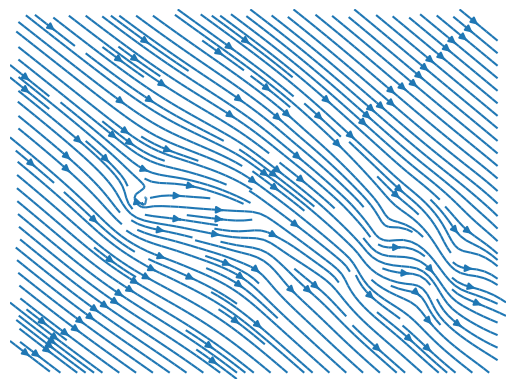

Plot for t =  2.3


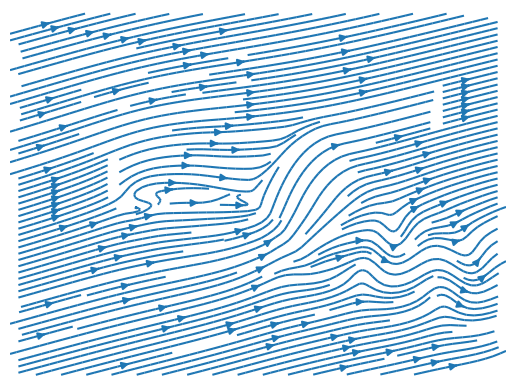

Plot for t =  2.4


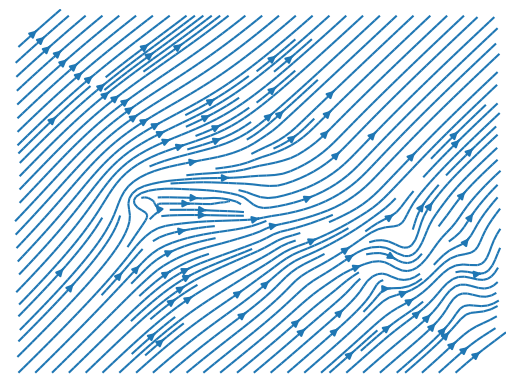

Plot for t =  2.5


In [ ]:
for i in range(1,11):
  df_i = df_new[df_new['t'] == (1.5+(0.1*i))].iloc[:10000]

  pivot_df_ti = df_i.pivot(index='y', columns='x', values=['u', 'v'])

  grid_x = np.linspace(df_i['x'].min(), df_i['x'].max(), 100)  # Adjust 100 as needed
  grid_y = np.linspace(df_i['y'].min(), df_i['y'].max(), 100)  # Adjust 100 as needed
  X, Y = np.meshgrid(grid_x, grid_y)
  u_grid = griddata((df_i['x'], df_i['y']), df_i['u'], (X, Y), method='linear')
  v_grid = griddata((df_i['x'], df_i['y']), df_i['v'], (X, Y), method='linear')

  generate_streamlines(X, Y, u_grid, v_grid, i)

  print('Plot for t = ', 1.5 + 0.1*i)

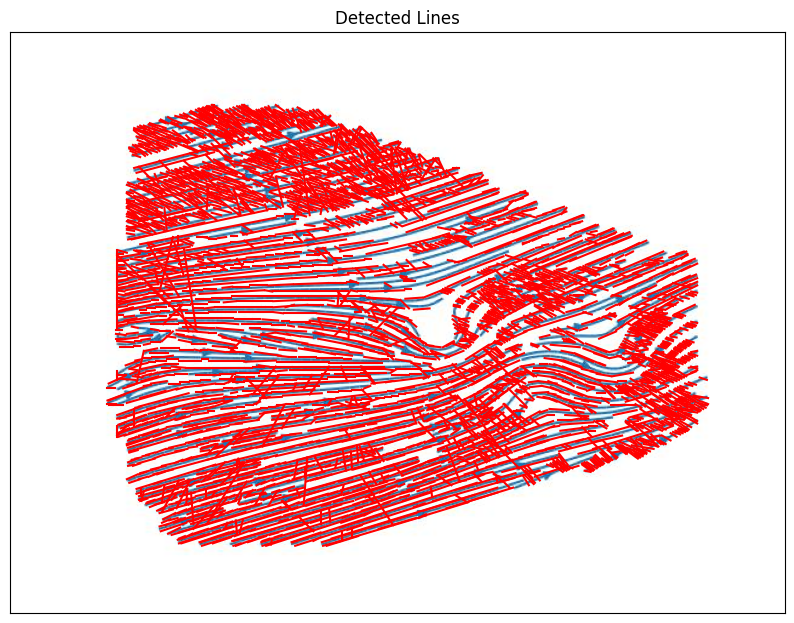

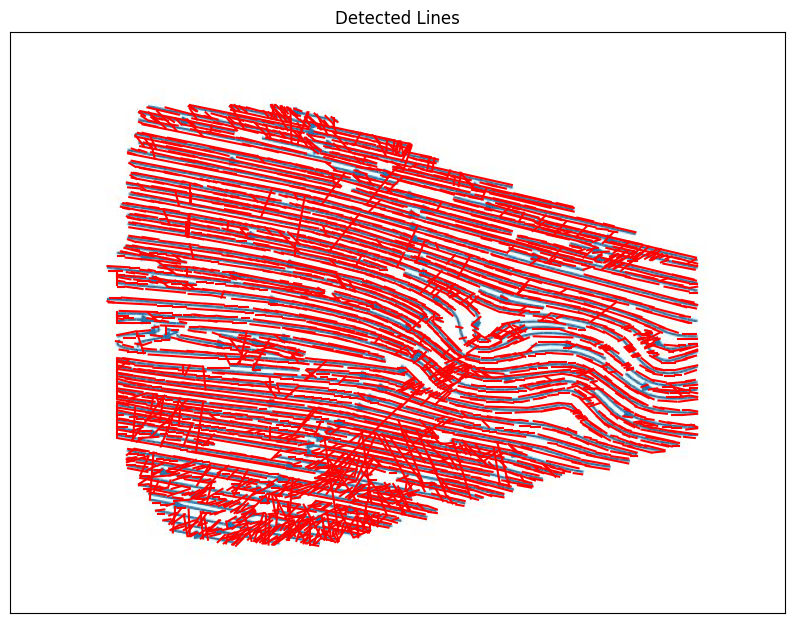

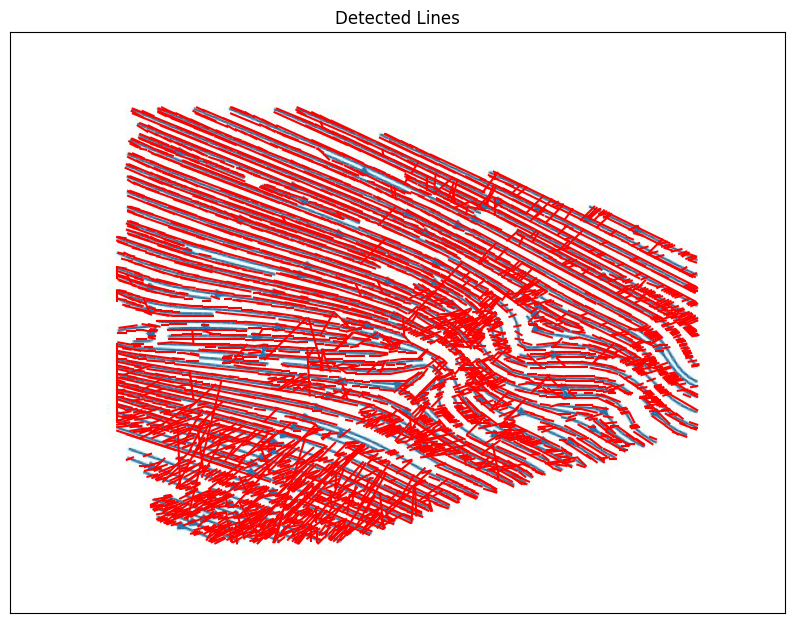

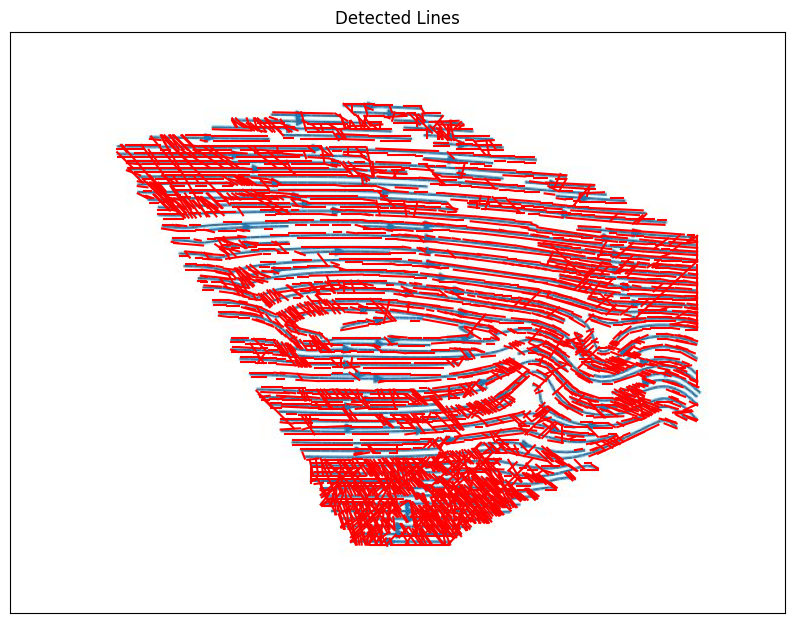

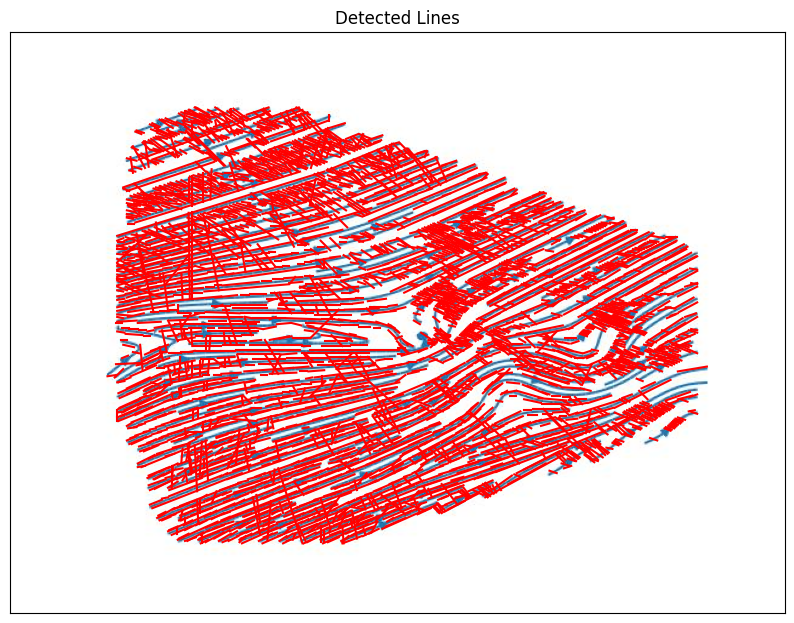

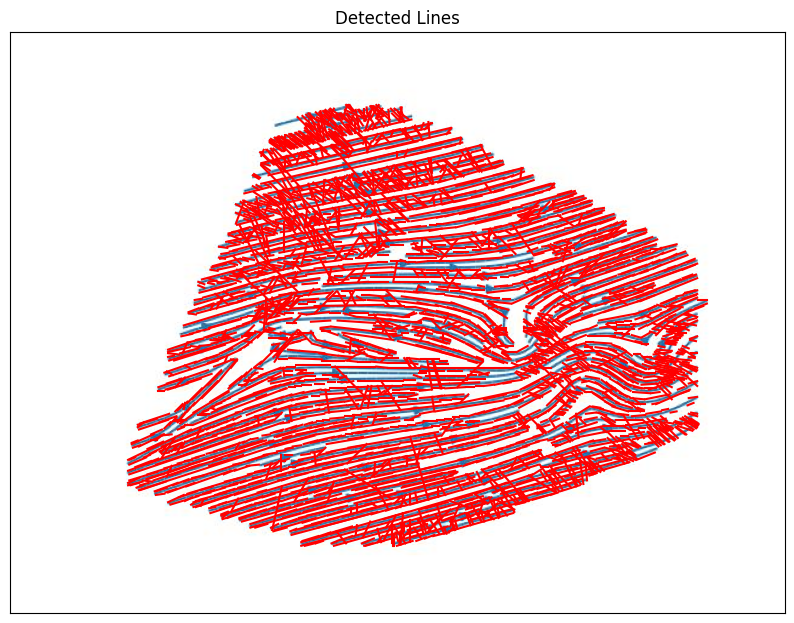

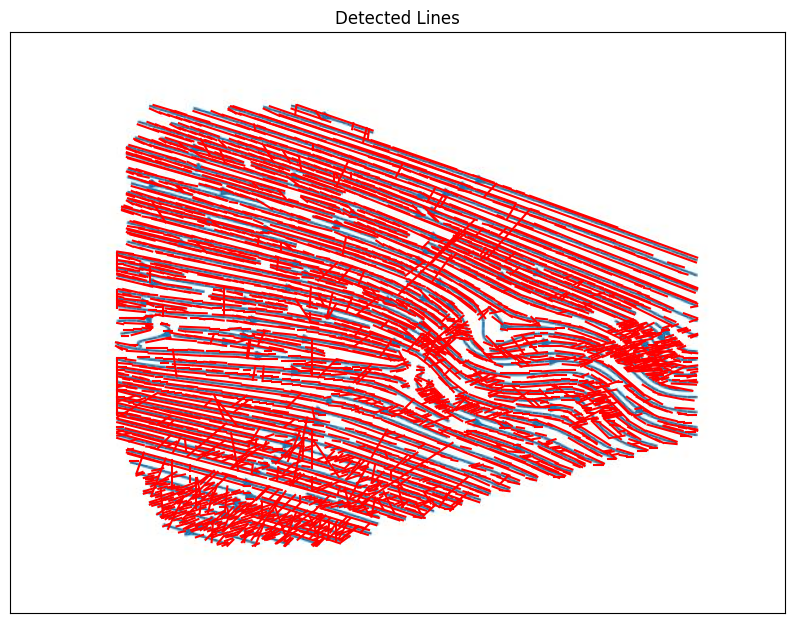

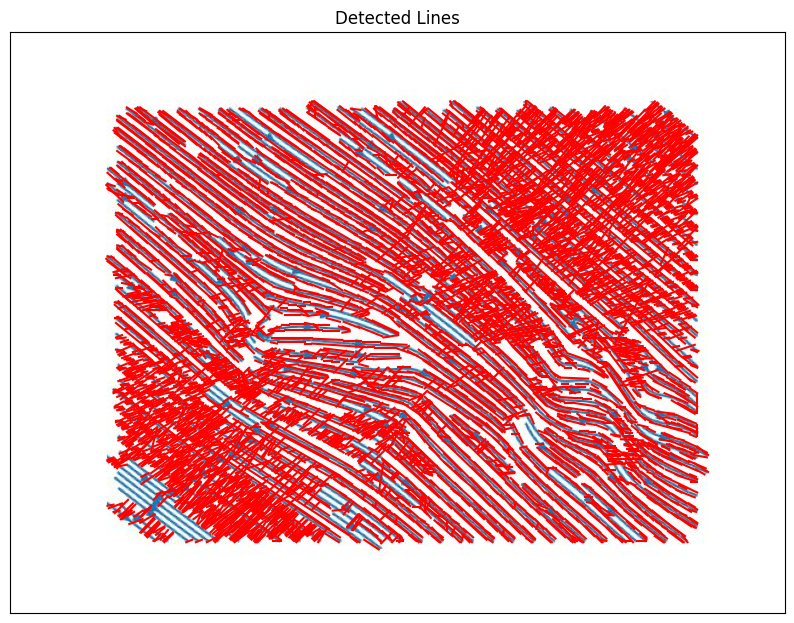

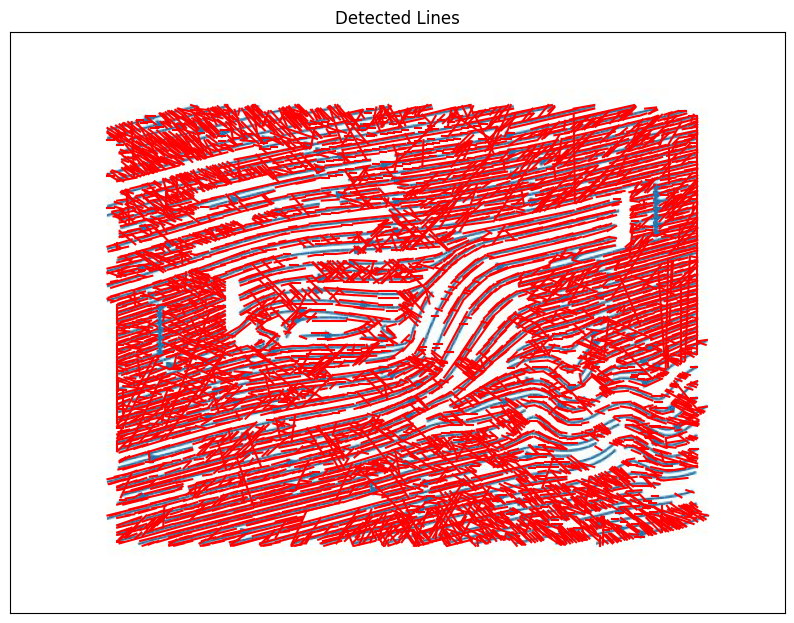

In [ ]:
for i in range(1,10):
  # Load the image
  image = io.imread(f'plot_{i}.jpg')

  # Convert the image to grayscale
  gray_image = color.rgb2gray(image)

  # Apply Canny edge detection
  edges = canny(gray_image, sigma=2)

  # Perform probabilistic Hough line transform
  lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)

  # Draw the detected lines on the original image
  fig, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(image, cmap=plt.cm.gray)
  for line in lines:
      p0, p1 = line
      ax.plot((p0[0], p1[0]), (p0[1], p1[1]), 'r')

  ax.set_title('Detected Lines')
  ax.axis('image')
  ax.set_xticks([])
  ax.set_yticks([])
  plt.show()

# Parijat Mudras-22B2169

In [ ]:
def grid_density(lines, grid_size):
    density_map = defaultdict(int)
    for line in lines:
        p0, p1 = line
        x0, y0 = p0
        x1, y1 = p1
        min_x = min(x0, x1)
        min_y = min(y0, y1)
        max_x = max(x0, x1)
        max_y = max(y0, y1)
        # Calculate grid coordinates
        min_i, min_j = int(min_x // grid_size), int(min_y // grid_size)
        max_i, max_j = int(max_x // grid_size), int(max_y // grid_size)
        # Iterate over cells intersected by the line and increment density
        for i in range(min_i, max_i + 1):
            for j in range(min_j, max_j + 1):
                density_map[(i, j)] += 1
    return density_map

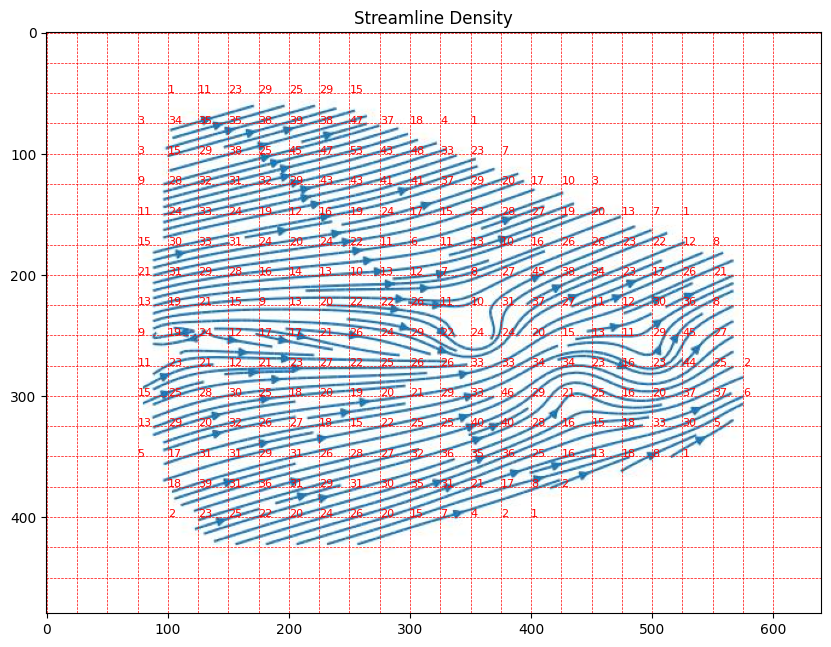

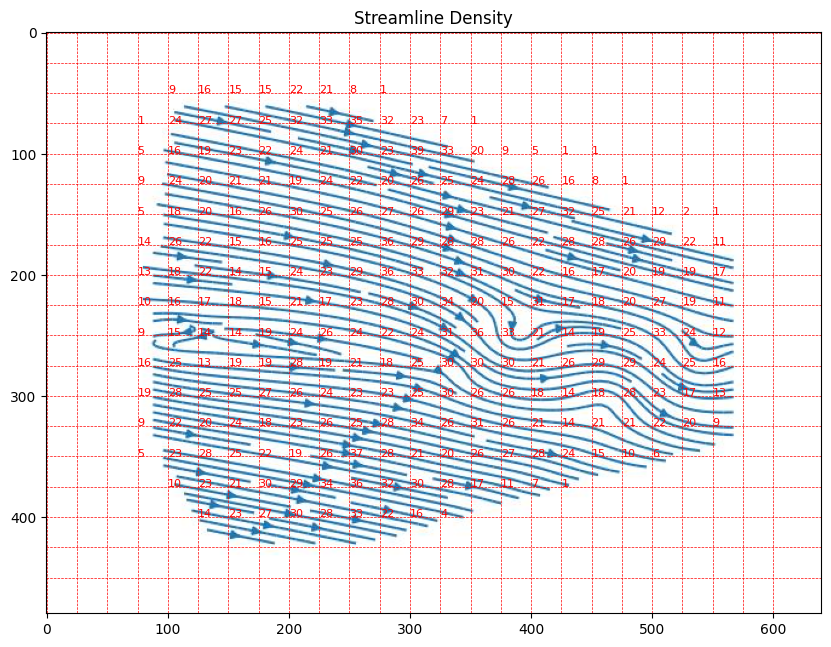

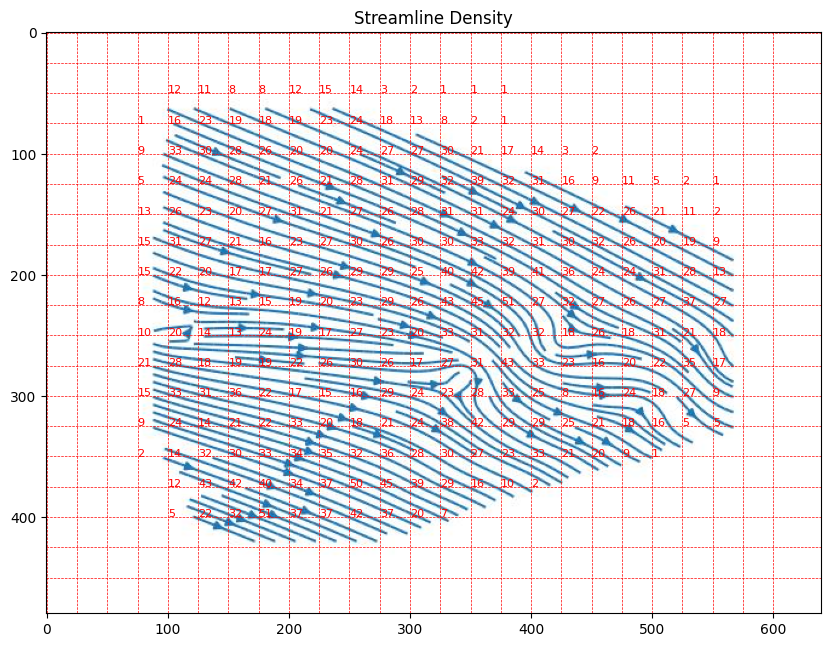

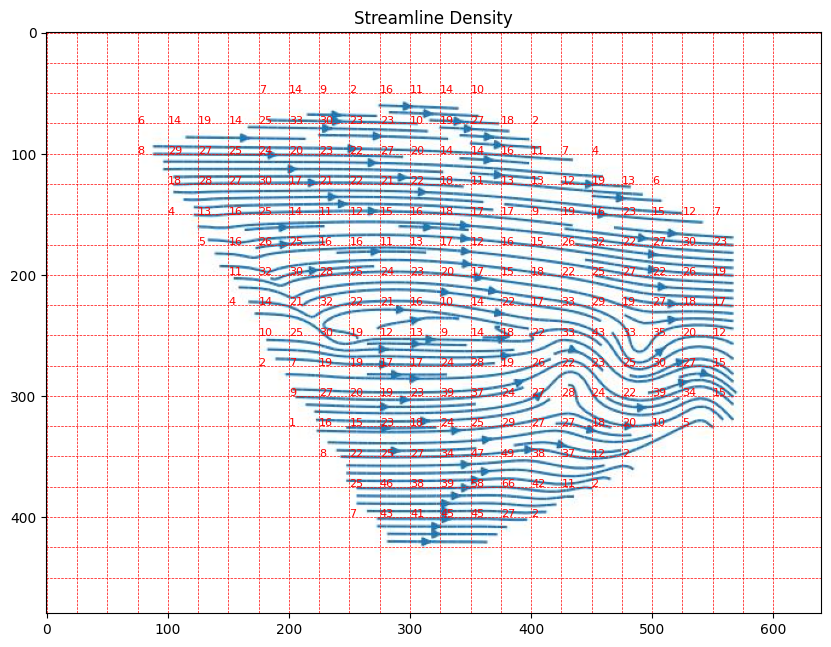

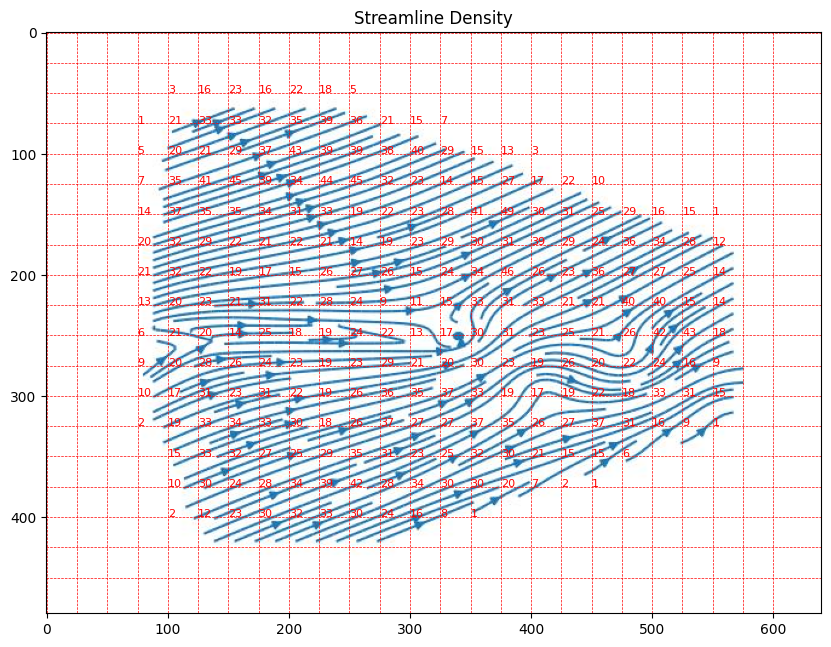

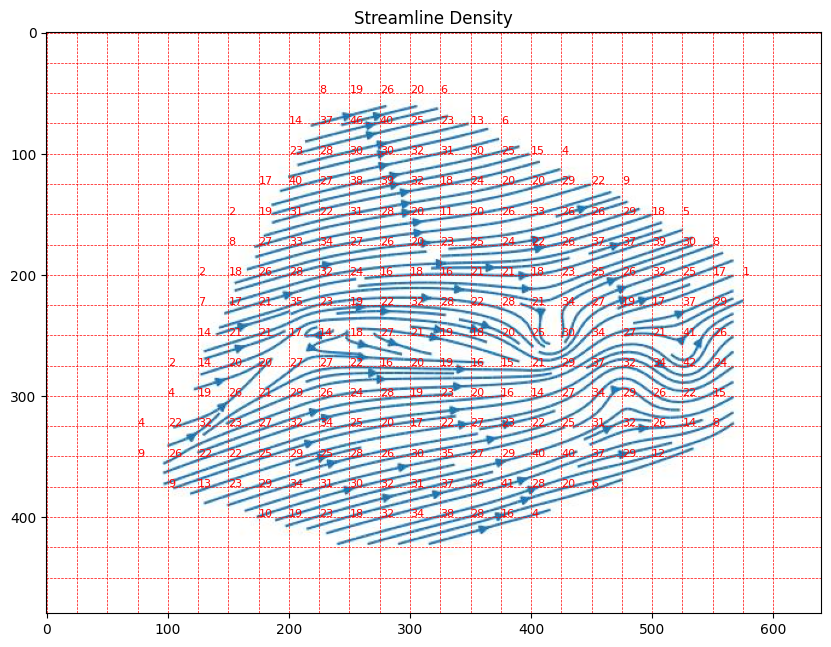

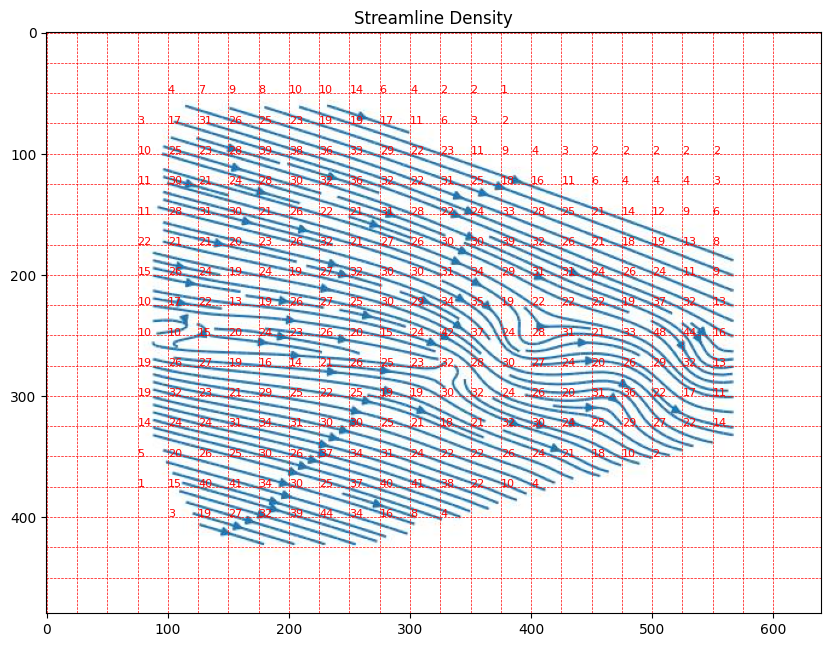

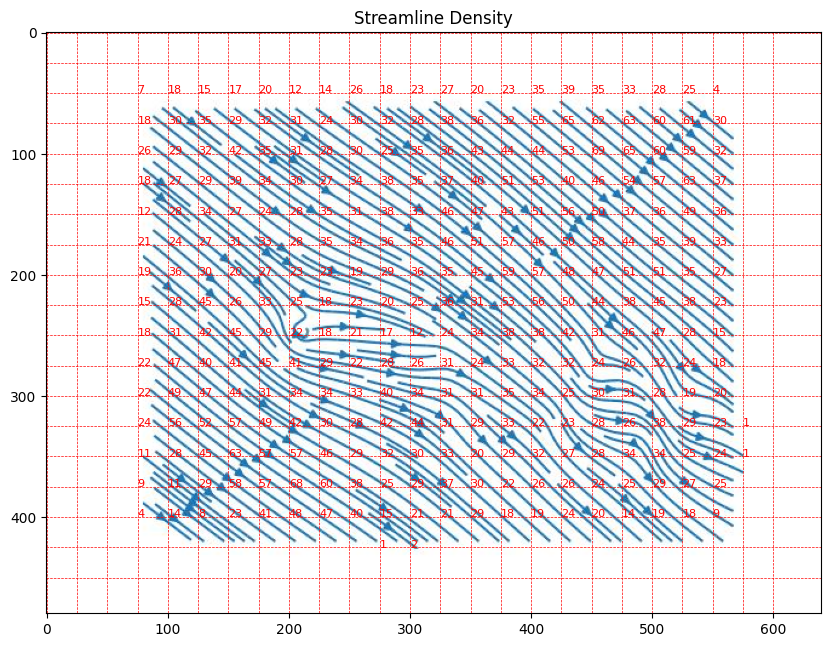

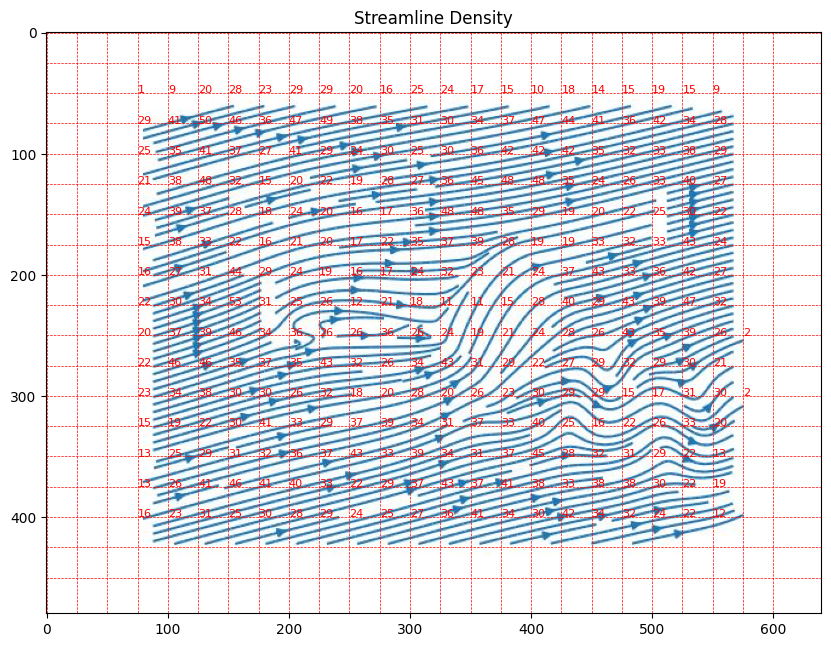

In [ ]:
for i in range(1,10):
  # Load the image
  image = io.imread(f'plot_{i}.jpg')

  # Convert the image to grayscale
  gray_image = color.rgb2gray(image)

  # Apply Canny edge detection
  edges = canny(gray_image, sigma=2)

  # Perform probabilistic Hough line transform
  lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)

  # Define grid size
  grid_size = 25  # Adjust grid size as needed

  # Calculate streamline density in each grid cell
  density_map = grid_density(lines, grid_size)

  # Plot the image with grid cells and visualize density
  fig, ax = plt.subplots(figsize=(10, 10))
  ax.imshow(image, cmap=plt.cm.gray)

  # Plot grid lines
  for i in range(gray_image.shape[1] // grid_size):
    ax.axvline(i * grid_size, color='r', linestyle='--', linewidth=0.5)
  for j in range(gray_image.shape[0] // grid_size):
    ax.axhline(j * grid_size, color='r', linestyle='--', linewidth=0.5)

  # Plot density in each grid cell
  for (i, j), density in density_map.items():
    ax.text(i * grid_size, j * grid_size, str(density), color='r', fontsize=8)

  ax.set_title('Streamline Density')
  ax.axis('image')

  plt.show()

In [ ]:
import matplotlib.pyplot as plt
from skimage import io, color
from skimage.feature import canny
from skimage.transform import probabilistic_hough_line
import pandas as pd

def grid_density(lines, grid_size, image_shape):
    import numpy as np
    density_map = {}
    for line in lines:
        for x, y in line:
            i, j = int(x // grid_size), int(y // grid_size)
            if (i, j) not in density_map:
                density_map[(i, j)] = 0
            density_map[(i, j)] += 1
    # Normalize by the number of points that could fall in a grid cell
    for key in density_map:
        density_map[key] /= (grid_size * grid_size / (image_shape[0] * image_shape[1]))
    return density_map

dataframes = []  # List to hold each image's DataFrame

for i in range(1, 10):
    image = io.imread(f'plot_{i}.jpg')
    gray_image = color.rgb2gray(image)
    edges = canny(gray_image, sigma=2)
    lines = probabilistic_hough_line(edges, threshold=10, line_length=5, line_gap=3)
    grid_size = 25

    # Calculate density and prepare data for DataFrame
    density_map = grid_density(lines, grid_size, gray_image.shape)
    data = []
    for (i, j), density in density_map.items():
        centroid_x = (i * grid_size + grid_size / 2)*0.004-0.3
        centroid_y = (j * grid_size + grid_size / 2)*(-1/375)+(0.63333)
        data.append({'Grid_Center_X': centroid_x, 'Grid_Center_Y': centroid_y, 'Density': density})

    # Create DataFrame
    df = pd.DataFrame(data)
    dataframes.append(df)  # Add DataFrame to the list

# Example of how to access the DataFrame for the first image
print(dataframes[8])


     Grid_Center_X  Grid_Center_Y   Density
0             0.85       0.066663   8847.36
1             0.85       0.133330  14745.60
2             1.45      -0.266670  14745.60
3             0.45      -0.400003  16711.68
4             0.85      -0.333337  17203.20
..             ...            ...       ...
298           2.05      -0.400003    491.52
299           0.25      -0.266670   6389.76
300           2.05      -0.200003    983.04
301           2.05      -0.066670    491.52
302           0.05       0.466663    491.52

[303 rows x 3 columns]


In [ ]:
df1 = pd.read_csv(csv_path)

In [ ]:
import pandas as pd

# Assuming df is your DataFrame

# Filter the DataFrame based on the range of 't' values
filtered_df = df1[(df1['t'] >= 1.6) & (df1['t'] <=2.50)]

# Define an empty DataFrame to store the sampled data points
sampled_df = pd.DataFrame()

# Sample 1000 random data points from each value of 't'
for t_value in filtered_df['t'].unique():
    filtered_subset = filtered_df[filtered_df['t'] == t_value]
    if len(filtered_subset) >10000:
        random_sample = filtered_subset.sample(n=10000, random_state=42)
    else:
        random_sample = filtered_subset  # If there are less than 1000 data points, include all
    sampled_df = pd.concat([sampled_df, random_sample])

# Now you have a DataFrame containing 1000 random data points for each 't' value in the range 1.6 to 2.5


In [ ]:
sampled_df


,Unnamed: 0,t,x,y,u,v,p,eta,velocity_y,acceleration_y
1171750,1171750,1.6,2.041103,0.676117,0.924732,0.566450,0.212201,-0.109591,-0.562693,6.405520
1169308,1169308,1.6,-0.189350,-0.978429,0.927455,0.530345,-0.426408,-0.109591,-0.562693,6.405520
1156059,1156059,1.6,0.025249,-0.026716,-0.526545,0.465446,-0.541357,-0.109591,-0.562693,6.405520
1164725,1164725,1.6,1.117718,-0.626393,1.079520,0.570508,-0.513826,-0.109591,-0.562693,6.405520
1162343,1162343,1.6,0.573727,0.071120,0.203039,-0.033642,2.138488,-0.109591,-0.562693,6.405520
...,...,...,...,...,...,...,...,...,...,...
2901701,2901701,2.5,0.956901,-0.122828,2.210597,0.361957,-0.102380,-0.074805,-0.743522,0.341418
2899335,2899335,2.5,-0.001540,-0.014944,-1.202058,1.574078,-0.751723,-0.074805,-0.743522,0.341418
2897694,2897694,2.5,0.160064,0.111089,1.664222,0.226130,-1.998072,-0.074805,-0.743522,0.341418
2905022,2905022,2.5,0.738313,0.354839,0.939740,0.266173,-0.530735,-0.074805,-0.743522,0.341418


In [ ]:
X=sampled_df[['t','x','y']]
y=sampled_df[['p']]
import numpy as np
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

# Step 1: Data Collection and Preprocessing
# Assuming you have your features (X) and labels (y) loaded

# Step 2: Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the architecture of the neural network
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(3,)),
    tf.keras.layers.Dense(64, activation='relu'),
    tf.keras.layers.Dense(1)  # No activation function for regression
])

# Compile the model
model.compile(optimizer='adam',
              loss='mean_squared_error',  # Using mean squared error loss for regression
              metrics=['mae'])  # Monitoring mean absolute error during training

# Train the model
model.fit(X_train, y_train, epochs=5, batch_size=32)

# Now you can use the trained model for prediction
# For example, generate some test data


# Predict using the model
predictions = model.predict(X_test)

# Evaluate the model on the test data
loss, mae = model.evaluate(X_test, y_test)
print(f'Test Loss: {loss}, Test MAE: {mae}')
from sklearn.metrics import r2_score
r_squared = r2_score(y_test, predictions)
print(f'R-squared: {r_squared}')


Epoch 1/5
22750/22750 [==============================] - 66s 3ms/step - loss: 2.4749 - mae: 1.0588
Epoch 2/5
22750/22750 [==============================] - 65s 3ms/step - loss: 0.4088 - mae: 0.4228
Epoch 3/5
22750/22750 [==============================] - 64s 3ms/step - loss: 0.1739 - mae: 0.2818
Epoch 4/5
22750/22750 [==============================] - 65s 3ms/step - loss: 0.1183 - mae: 0.2372
Epoch 5/5
5688/5688 [==============================] - 14s 2ms/step - loss: 0.0957 - mae: 0.2186
Test Loss: 0.09566590934991837, Test MAE: 0.218604177236557
R-squared: 0.9746285481439683


In [ ]:
print(predictions)

[[ 0.12606326]
 [ 0.534251  ]
 [ 0.35758135]
 ...
 [-1.1393927 ]
 [-0.06297812]
 [-2.865523  ]]


In [ ]:
# Process each plot and extract data
neural_predictions = {}
dfs={}
for i in range(9):
  df_name = f'new_data{i*0.1+1.6}'
  dfs[df_name] = []
  pred_name = f'pred_{i*0.1+1.6}'
  neural_predictions[pred_name] = []

  for j in range(200):  # Adjust the range as needed
    # Generate the value for the first column in the loop
    first_column_value = i * 0.1 +1.6 # Adjust the logic according to your requirements

    # Retrieve the corresponding values from the existing DataFrame
    existing_values = dataframes[i].iloc[j]  # Assuming each row corresponds to one iteration of the loop

    # Append the data for the new row to the list
    data_point = (i*0.1+1.6, existing_values['Grid_Center_X'], existing_values['Grid_Center_Y'])

# Pass the data_point to np.array()
    your_data = np.array(data_point)[np.newaxis, :]
    #dfs[df_name].append([[first_column_value, existing_values['Grid_Center_X'], existing_values['Grid_Center_Y']]])
    neural_predictions[pred_name].append(model.predict(your_data))
    # Set verbose=0 to suppress output during prediction








1/1 [==============================] - 0s 24ms/step


In [ ]:
print(neural_predictions)

{'pred_1.6': [array([[-0.28426257]], dtype=float32), array([[-0.44173083]], dtype=float32), array([[-2.264337]], dtype=float32), array([[-2.9081535]], dtype=float32), array([[-0.5676718]], dtype=float32), array([[-0.15430334]], dtype=float32), array([[-0.93977463]], dtype=float32), array([[-0.7375295]], dtype=float32), array([[-0.8889607]], dtype=float32), array([[1.8452363]], dtype=float32), array([[2.2619681]], dtype=float32), array([[-1.0391985]], dtype=float32), array([[0.06195733]], dtype=float32), array([[-0.85671985]], dtype=float32), array([[2.3894005]], dtype=float32), array([[1.3636978]], dtype=float32), array([[-1.0036753]], dtype=float32), array([[-0.7101065]], dtype=float32), array([[-0.52175486]], dtype=float32), array([[-1.3596636]], dtype=float32), array([[-2.0109634]], dtype=float32), array([[-0.84914565]], dtype=float32), array([[-0.11441213]], dtype=float32), array([[0.1357806]], dtype=float32), array([[-0.97125304]], dtype=float32), array([[-1.0433668]], dtype=float

In [ ]:
lists_per_key = list(neural_predictions.values())

# Print the resulting list of lists
print(lists_per_key)

[[array([[-0.28426257]], dtype=float32), array([[-0.44173083]], dtype=float32), array([[-2.264337]], dtype=float32), array([[-2.9081535]], dtype=float32), array([[-0.5676718]], dtype=float32), array([[-0.15430334]], dtype=float32), array([[-0.93977463]], dtype=float32), array([[-0.7375295]], dtype=float32), array([[-0.8889607]], dtype=float32), array([[1.8452363]], dtype=float32), array([[2.2619681]], dtype=float32), array([[-1.0391985]], dtype=float32), array([[0.06195733]], dtype=float32), array([[-0.85671985]], dtype=float32), array([[2.3894005]], dtype=float32), array([[1.3636978]], dtype=float32), array([[-1.0036753]], dtype=float32), array([[-0.7101065]], dtype=float32), array([[-0.52175486]], dtype=float32), array([[-1.3596636]], dtype=float32), array([[-2.0109634]], dtype=float32), array([[-0.84914565]], dtype=float32), array([[-0.11441213]], dtype=float32), array([[0.1357806]], dtype=float32), array([[-0.97125304]], dtype=float32), array([[-1.0433668]], dtype=float32), array([

In [ ]:
# Example dictionary

# Create separate arrays for each key
arrays_per_key = [np.array(values) for values in neural_predictions.values()]

# Print the first array
arrays_per_key_flat = [array.flatten() for array in arrays_per_key]

# Create separate DataFrames for each array
dfs_per_key = [pd.DataFrame(array) for array in arrays_per_key_flat]

# Print the first DataFrame
print(dfs_per_key[0])

            0
0   -0.284263
1   -0.441731
2   -2.264337
3   -2.908154
4   -0.567672
..        ...
195 -1.321825
196  1.308381
197  1.582664
198 -1.195068
199  1.686762

[200 rows x 1 columns]


In [ ]:
from scipy.stats import spearmanr, kendalltau
for i in range(9):
  df1_subset = dataframes[i].iloc[:200]
  df2_subset = dfs_per_key[i].iloc[:200]

# Calculate the correlation coefficient
  correlation_coefficient = df1_subset['Density'].corr(df2_subset.iloc[:, 0])
  spearman_corr, spearman_p_value = spearmanr(df1_subset['Density'],df2_subset.iloc[:, 0])
# Print the correlation coefficient
  print("Correlation coefficient:", correlation_coefficient)


Correlation coefficient: 0.1695729021047275
Correlation coefficient: -0.20981673585707578
Correlation coefficient: -0.13421238257511076
Correlation coefficient: 0.06501974434853047
Correlation coefficient: 0.04321139226829065
Correlation coefficient: 0.17440422206217682
Correlation coefficient: -0.17596684809122767
Correlation coefficient: 0.21843469573188679
Correlation coefficient: 0.11662937682970405


In [ ]:

print("Spearman's Rank Correlation Coefficient:", spearman_corr)
print("p-value:", spearman_p_value)

Spearman's Rank Correlation Coefficient: 0.10930700870507953
p-value: 0.12337386415243774
